## DP1 strong optical--NIR source inspection

This notebook visually inspects sources with strong optical--NIR
contrasts identified from the final DP1 fusion catalogue using forced
photometry.

The statistical extreme-source populations are defined in
`DP1_Source_Statistics.ipynb`. For visual inspection, a stronger
contrast subset is used, requiring S/N >= 5 in at least two bands in
one wavelength regime and |S/N| < 3 in every valid forced measurement
in the opposite regime, together with the core-band coverage and
image-quality requirements defined in the statistics notebook.

The visual selections are used only to identify illustrative examples
and do not modify the source-population statistics.

### 1. Imports

In [1]:
from pathlib import Path
import gc

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from astropy.visualization import ZScaleInterval

import lsst.geom as geom
from lsst.daf.butler import Butler

from matplotlib.patches import Circle

### 2. Data and repository setup

In [2]:
# ============================================================
# Input tables produced by DP1_Source_Statistics.ipynb
# ============================================================

STRONG_INSPECTION_FILE = Path(
    "data/DP1_strong_contrast_inspection_forced.csv"
)

FINAL_EXAMPLE_FILE = Path(
    "data/DP1_final_example_inspection.csv"
)


# ============================================================
# Repositories
# ============================================================

COMCAM_REPO = "dp1"
COMCAM_COLLECTION = "LSSTComCam/DP1"
COMCAM_DATASET_TYPE = "deep_coadd"

VIRCAM_REPO = "lsst-ir-fusion-dp1"
VIRCAM_COLLECTION = (
    "u/ir-sare1/DRP/videoCoaddDetect/20260405T092826Z"
)
VIRCAM_DATASET_TYPE = "deepCoadd_calexp"

SKYMAP = "lsst_cells_v1"


COMCAM_BANDS = [
    "u", "g", "r", "i", "z", "y"
]

VIRCAM_BANDS = [
    "Z", "Y", "J", "H", "K"
]


butler_comcam = Butler.from_config(
    COMCAM_REPO,
    collections=COMCAM_COLLECTION,
)

butler_vista = Butler.from_config(
    VIRCAM_REPO
)

registry_vista = butler_vista.registry

skyMap = butler_comcam.get(
    "skyMap",
    skymap=SKYMAP,
)

### 3. Ranked strong-contrast inspection sample

Load the ranked strong-contrast sources produced by the statistics
notebook. This table is used only for visual inspection and selection
of clean illustrative examples.

In [3]:
# ============================================================
# Ranked strong-contrast inspection sample
# ============================================================

inspection_candidates = pd.read_csv(
    STRONG_INSPECTION_FILE
)


# ------------------------------------------------------------
# Compatibility with inspection files created before the
# final statistics-notebook cleanup
# ------------------------------------------------------------

# Add a simple inspection ID if it is not already present.
if "inspection_id" not in inspection_candidates.columns:

    inspection_candidates[
        "inspection_id"
    ] = np.arange(
        1,
        len(inspection_candidates) + 1,
    )


# The forced S/N values are NaN when the measurement does not
# pass the full forced-photometry validity selection.
# Therefore the number of finite S/N values gives the number
# of valid bands.
if "n_valid_bands" not in inspection_candidates.columns:

    snr_columns = (
        [
            f"snr_ComCam_{band}"
            for band in COMCAM_BANDS
        ]
        +
        [
            f"snr_VIRCAM_{band}"
            for band in VIRCAM_BANDS
        ]
    )

    inspection_candidates[
        "n_valid_bands"
    ] = (
        inspection_candidates[
            snr_columns
        ]
        .notna()
        .sum(axis=1)
    )


# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------

print(
    f"Inspection candidates: "
    f"{len(inspection_candidates)}"
)

print()

print(
    inspection_candidates[
        "sample"
    ].value_counts()
)


display(
    inspection_candidates[
        [
            "inspection_id",
            "catalog_row",
            "sample",
            "ra_deg",
            "dec_deg",
            "n_valid_bands",
            "n_significant_bands",
            "median_significant_snr",
            "max_abs_opposite_snr",
            "nearest_primary_sep_arcsec",
        ]
    ]
)

Inspection candidates: 24

sample
NIR_significant       20
ComCam_significant     4
Name: count, dtype: int64


,inspection_id,catalog_row,sample,ra_deg,dec_deg,n_valid_bands,n_significant_bands,median_significant_snr,max_abs_opposite_snr,nearest_primary_sep_arcsec
0,1,163503,ComCam_significant,53.621950,-27.659692,9,3,6.056666,2.207638,6.092301
1,2,573825,ComCam_significant,53.604866,-27.840971,10,2,5.694068,2.001595,8.568890
2,3,607371,ComCam_significant,53.720010,-28.046087,10,2,6.657598,2.090794,6.160234
3,4,883070,ComCam_significant,53.467985,-28.427412,10,2,5.985270,1.410415,6.002824
4,5,70179,NIR_significant,52.477046,-27.830815,9,5,20.118377,1.598241,9.754040
5,6,666836,NIR_significant,52.653276,-27.633525,11,5,16.247038,2.415569,9.236922
6,7,252997,NIR_significant,52.468875,-28.037428,9,5,19.939622,2.393062,8.197731
7,8,57122,NIR_significant,52.455010,-27.986315,9,5,44.895305,2.718032,8.128705
8,9,453852,NIR_significant,52.558058,-27.745834,9,5,15.140711,2.634865,7.941971
9,10,197408,NIR_significant,52.862614,-27.546313,11,5,10.319294,2.643548,7.802467


### 4. Coadd cutouts

Locate each source on the common Rubin SkyMap and retrieve the
corresponding ComCam and VIRCAM coadd cutouts.

In [4]:
CUTOUT_SIZE_PIX = 80


def get_tract_patch(ra_deg, dec_deg):

    coord = geom.SpherePoint(
        ra_deg * geom.degrees,
        dec_deg * geom.degrees,
    )

    tract_info = skyMap.findTract(coord)
    patch_info = tract_info.findPatch(coord)

    return (
        coord,
        tract_info.getId(),
        patch_info.getSequentialIndex(),
    )


def get_cutout(
    ra_deg,
    dec_deg,
    instrument,
    band,
):

    coord, tract, patch = get_tract_patch(
        ra_deg,
        dec_deg,
    )


    # --------------------------------------------------------
    # ComCam
    # --------------------------------------------------------

    if instrument == "ComCam":

        data_id = {
            "skymap": SKYMAP,
            "tract": tract,
            "patch": patch,
            "band": band,
        }

        exposure = butler_comcam.get(
            COMCAM_DATASET_TYPE,
            data_id,
        )


    # --------------------------------------------------------
    # VIRCAM
    #
    # Query the available deepCoadd_calexp refs in the
    # preferred run, then select the requested band.
    # This is the same retrieval method used by the
    # final paper-figure code.
    # --------------------------------------------------------

    else:

        data_id = {
            "skymap": SKYMAP,
            "tract": tract,
            "patch": patch,
        }

        refs = list(
            set(
                registry_vista.queryDatasets(
                    VIRCAM_DATASET_TYPE,
                    dataId=data_id,
                    collections=[
                        VIRCAM_COLLECTION
                    ],
                )
            )
        )

        refs = [
            ref
            for ref in refs
            if str(
                ref.dataId["band"]
            ) == band
        ]

        if len(refs) == 0:

            raise RuntimeError(
                f"No VIRCAM {band} coadd "
                f"for tract={tract}, "
                f"patch={patch}"
            )

        exposure = butler_vista.get(
            refs[0]
        )


    # --------------------------------------------------------
    # Cutout
    # --------------------------------------------------------

    cutout = exposure.getCutout(
        coord,
        geom.Extent2I(
            CUTOUT_SIZE_PIX,
            CUTOUT_SIZE_PIX,
        ),
    )

    del exposure
    gc.collect()

    return cutout, coord

### 5. Eleven-band source viewer

Display matched cutouts in the six ComCam and five VIRCAM bands.
Each panel is independently scaled for visual inspection. The red
circle marks the catalogue position, and the forced-photometry S/N is
shown above each panel.

In [5]:
def plot_candidate(
    table,
    candidate_index,
    id_column=None,
):

    row = table.iloc[
        candidate_index
    ]

    ra = float(
        row["ra_deg"]
    )

    dec = float(
        row["dec_deg"]
    )


    band_info = (
        [
            ("ComCam", band)
            for band in COMCAM_BANDS
        ]
        +
        [
            ("VIRCAM", band)
            for band in VIRCAM_BANDS
        ]
    )


    fig, axes = plt.subplots(
        3,
        4,
        figsize=(11, 8.5),
    )

    axes = axes.ravel()


    for ax, (
        instrument,
        band,
    ) in zip(
        axes,
        band_info,
    ):

        snr_column = (
            f"snr_{instrument}_{band}"
        )

        snr = row.get(
            snr_column,
            np.nan,
        )


        try:

            cutout, coord = get_cutout(
                ra,
                dec,
                instrument,
                band,
            )

            image = (
                cutout.image.array
            )

            finite = np.isfinite(
                image
            )


            if finite.any():

                values = image[
                    finite
                ]

                try:

                    vmin, vmax = (
                        ZScaleInterval()
                        .get_limits(
                            values
                        )
                    )

                except Exception:

                    vmin, vmax = (
                        np.nanpercentile(
                            values,
                            [1, 99],
                        )
                    )


                if (
                    not np.isfinite(vmin)
                    or not np.isfinite(vmax)
                    or vmin >= vmax
                ):

                    vmin, vmax = (
                        np.nanpercentile(
                            values,
                            [1, 99],
                        )
                    )


                if (
                    not np.isfinite(vmin)
                    or not np.isfinite(vmax)
                    or vmin >= vmax
                ):

                    centre = np.nanmedian(
                        values
                    )

                    spread = np.nanstd(
                        values
                    )

                    if (
                        not np.isfinite(
                            spread
                        )
                        or spread == 0
                    ):

                        spread = 1.0

                    vmin = (
                        centre
                        - spread
                    )

                    vmax = (
                        centre
                        + spread
                    )


                ax.imshow(
                    image,
                    origin="lower",
                    cmap="gray",
                    vmin=vmin,
                    vmax=vmax,
                )


                xy = (
                    cutout.wcs
                    .skyToPixel(
                        coord
                    )
                )

                x = (
                    xy.x
                    - cutout
                    .getBBox()
                    .getMinX()
                )

                y = (
                    xy.y
                    - cutout
                    .getBBox()
                    .getMinY()
                )


                ax.add_patch(
                    Circle(
                        (x, y),
                        radius=4.5,
                        fill=False,
                        linewidth=1.2,
                        edgecolor="red",
                    )
                )


            del cutout
            gc.collect()


        except Exception:

            ax.text(
                0.5,
                0.5,
                "Unavailable",
                ha="center",
                va="center",
                transform=ax.transAxes,
            )


        display_band = (
            r"$K_{\rm s}$"
            if (
                instrument
                == "VIRCAM"
                and band == "K"
            )
            else band
        )


        if np.isfinite(
            snr
        ):

            ax.set_title(
                (
                    f"{display_band}\n"
                    f"S/N = {snr:.1f}"
                ),
                fontsize=8,
            )

        else:

            ax.set_title(
                (
                    f"{display_band}\n"
                    "S/N = --"
                ),
                fontsize=8,
            )


        ax.set_xticks([])
        ax.set_yticks([])


    axes[-1].axis(
        "off"
    )


    sample_name = (
        row.get(
            "sample",
            ""
        )
    )


    if (
        id_column is not None
        and id_column in row.index
    ):

        source_label = (
            f"{id_column} = "
            f"{row[id_column]}"
        )

    else:

        source_label = (
            f"row {candidate_index}"
        )


    title = (
        f"{source_label}"
        f" — {sample_name}\n"
        f"RA = {ra:.6f} deg, "
        f"Dec = {dec:.6f} deg"
    )


    if (
        "n_significant_bands"
        in row.index
    ):

        title += (
            f" | "
            f"{int(row['n_significant_bands'])} "
            f"significant bands"
        )


    if (
        "max_abs_opposite_snr"
        in row.index
        and np.isfinite(
            row[
                "max_abs_opposite_snr"
            ]
        )
    ):

        title += (
            f" | max opposite |S/N| = "
            f"{row['max_abs_opposite_snr']:.2f}"
        )


    fig.suptitle(
        title,
        fontsize=12,
    )

    plt.tight_layout()
    plt.show()

### 6. Inspect ranked candidates

Choose any row from the ranked inspection table for visual inspection.

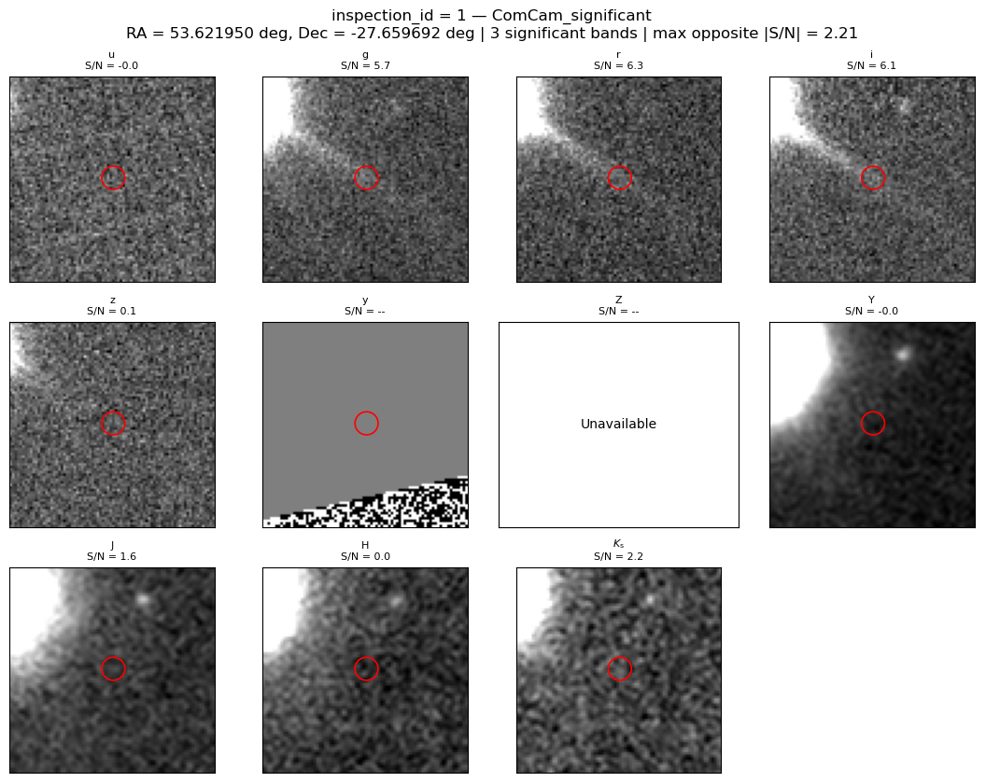

In [6]:
INSPECTION_INDEX = 0

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

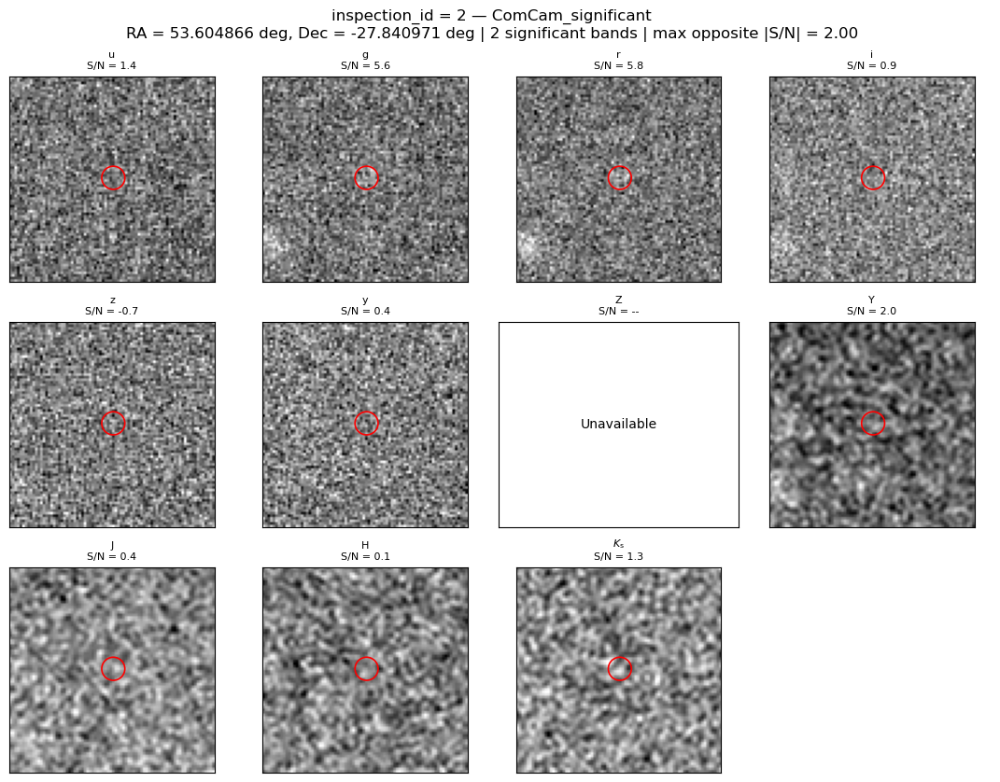

In [7]:
INSPECTION_INDEX = 1

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

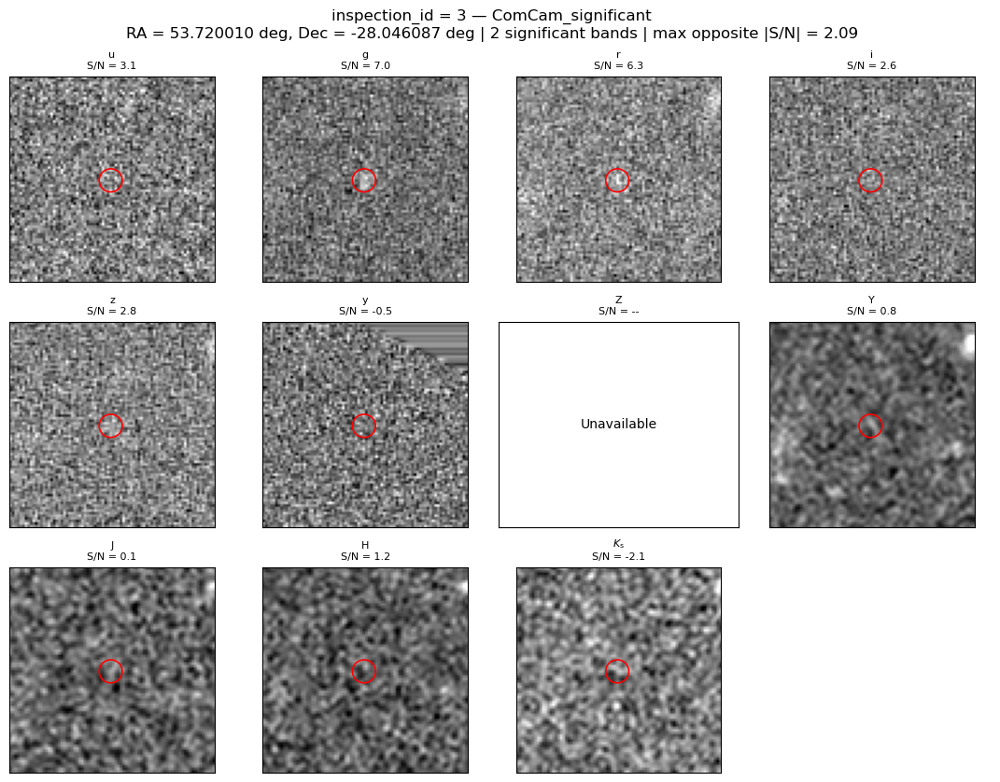

In [8]:
INSPECTION_INDEX = 2

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

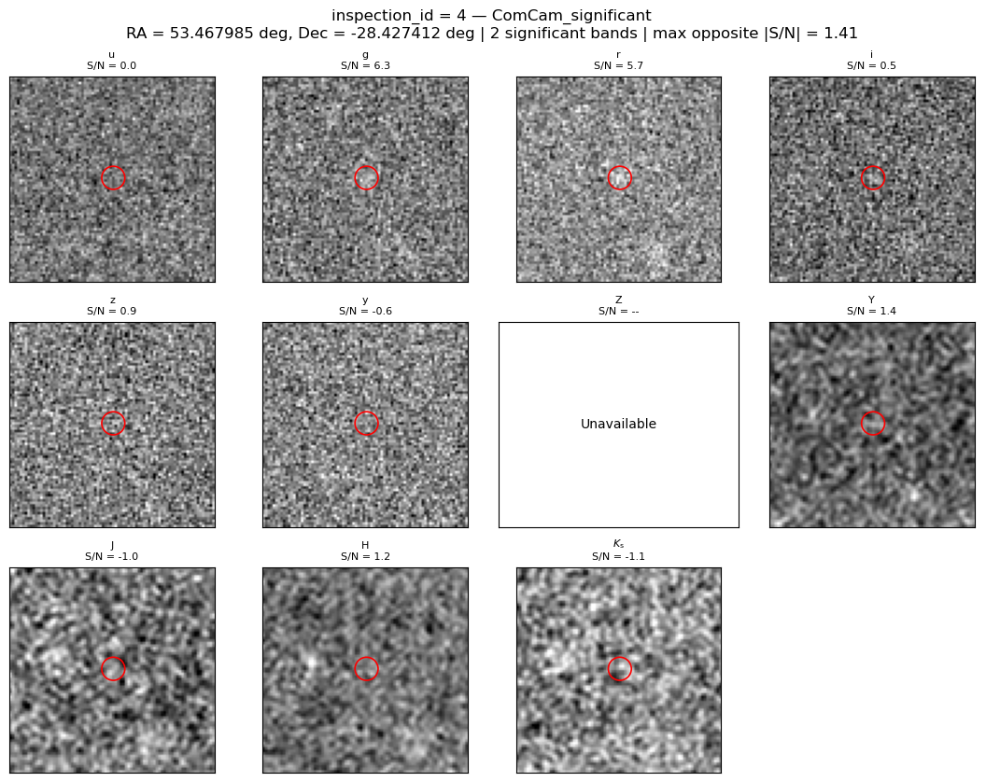

In [9]:
INSPECTION_INDEX = 3

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

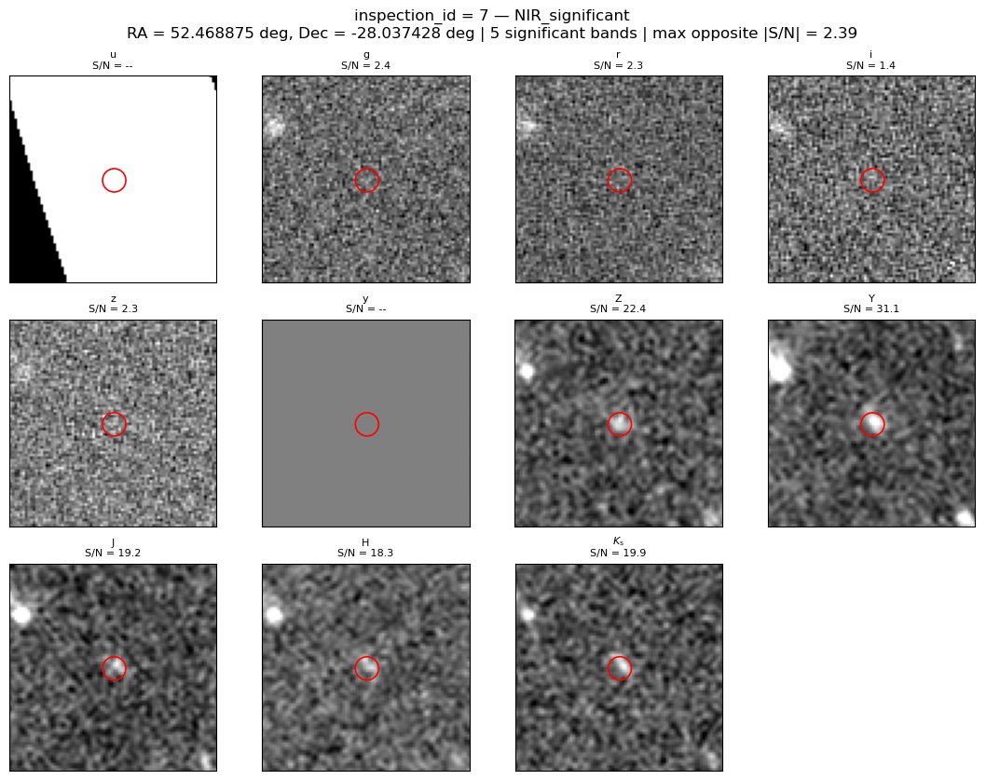

In [10]:
INSPECTION_INDEX = 6

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

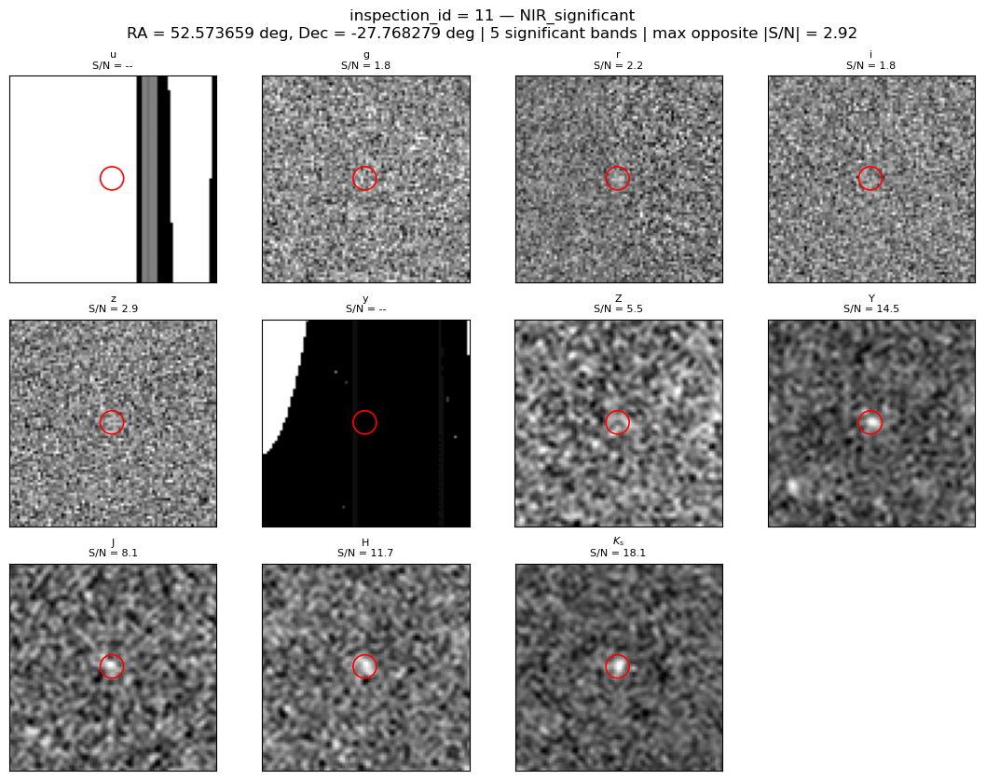

In [11]:
INSPECTION_INDEX = 10

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

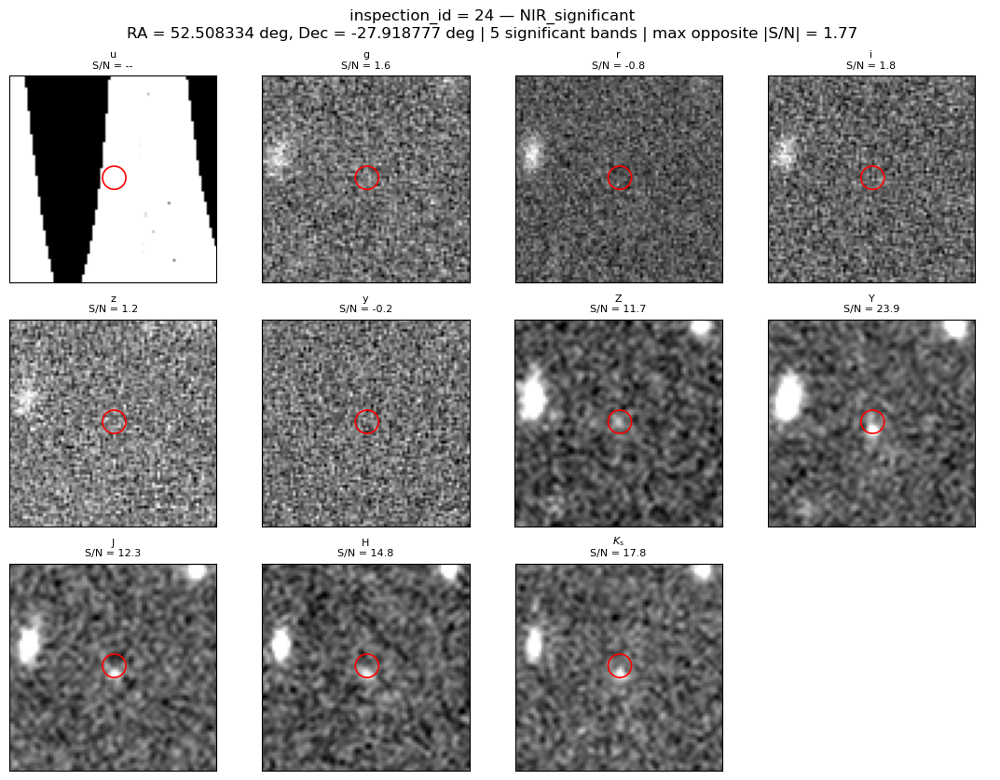

In [12]:
INSPECTION_INDEX = 23

plot_candidate(
    inspection_candidates,
    INSPECTION_INDEX,
    id_column="inspection_id",
)

### 7. Final paper examples

Load the four examples retained after visual inspection in the statistics
notebook. Candidates 1 and 2 are ComCam-significant examples, while
candidates 3 and 4 are NIR-significant examples.

In [13]:
final_examples = pd.read_csv(
    FINAL_EXAMPLE_FILE
)

display(
    final_examples[
        [
            "candidate_id",
            "catalog_row",
            "sample",
            "ra_deg",
            "dec_deg",
            "n_valid_bands",
            "n_significant_bands",
            "median_significant_snr",
            "max_abs_opposite_snr",
        ]
    ]
)

,candidate_id,catalog_row,sample,ra_deg,dec_deg,n_valid_bands,n_significant_bands,median_significant_snr,max_abs_opposite_snr
0,1,15805,ComCam_significant,53.073812,-27.732826,10,2,14.991056,1.279470
1,2,441278,ComCam_significant,53.593073,-27.926565,8,3,8.452413,1.713349
2,3,197408,NIR_significant,52.862614,-27.546313,11,5,10.319294,2.643548
3,4,666836,NIR_significant,52.653276,-27.633525,11,5,16.247038,2.415569


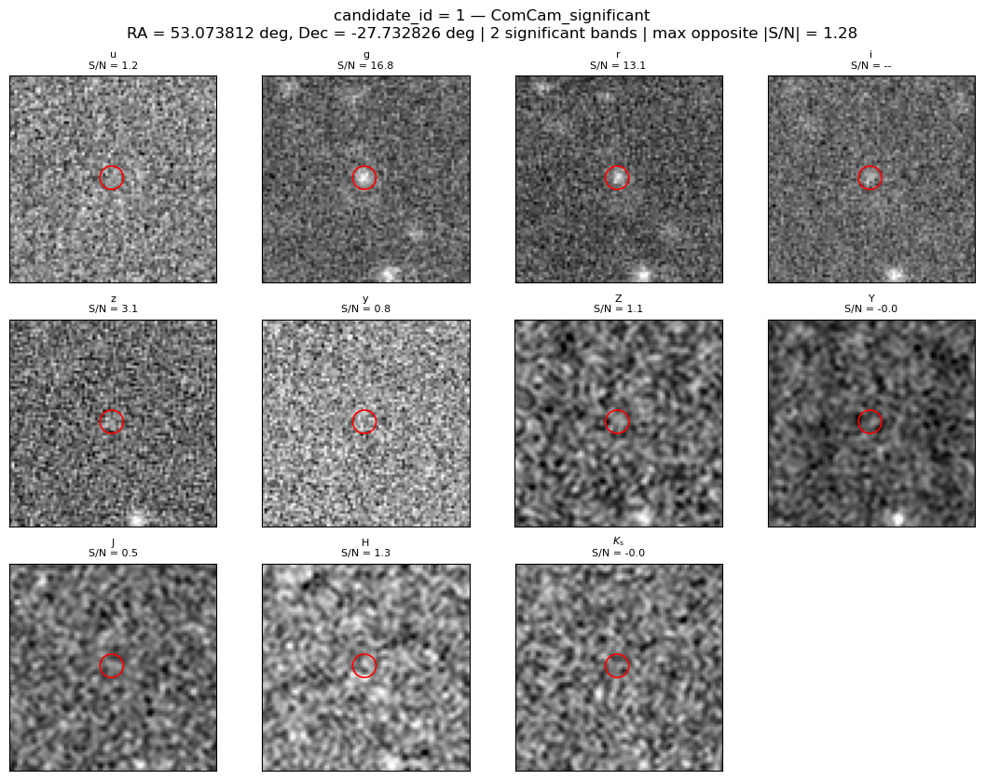

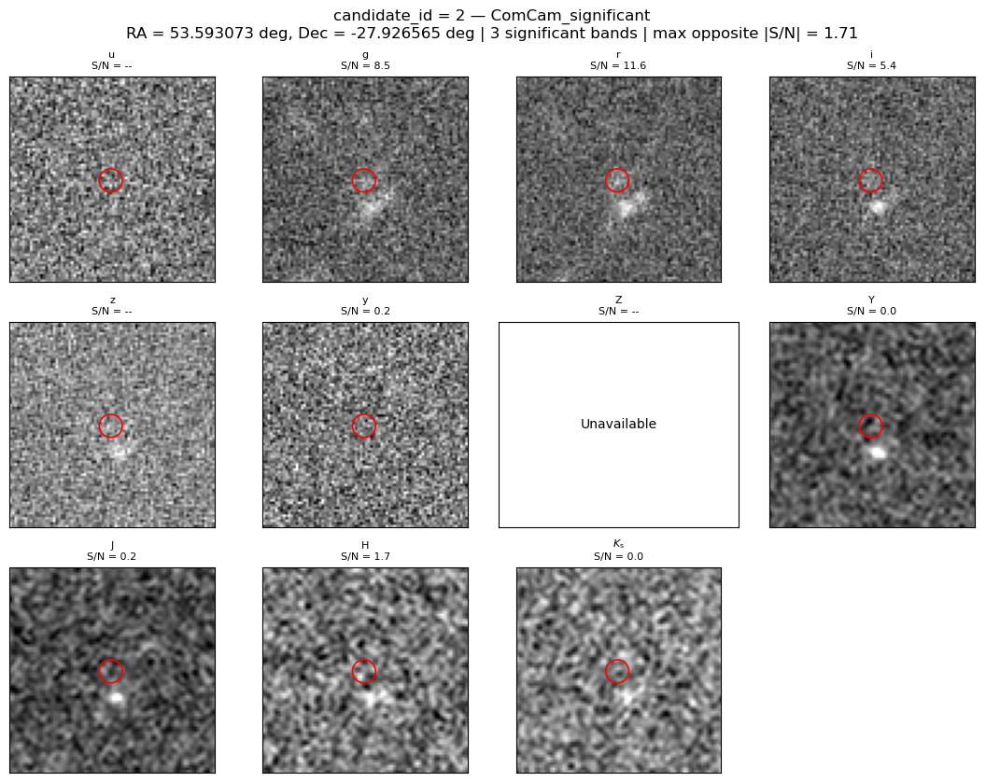

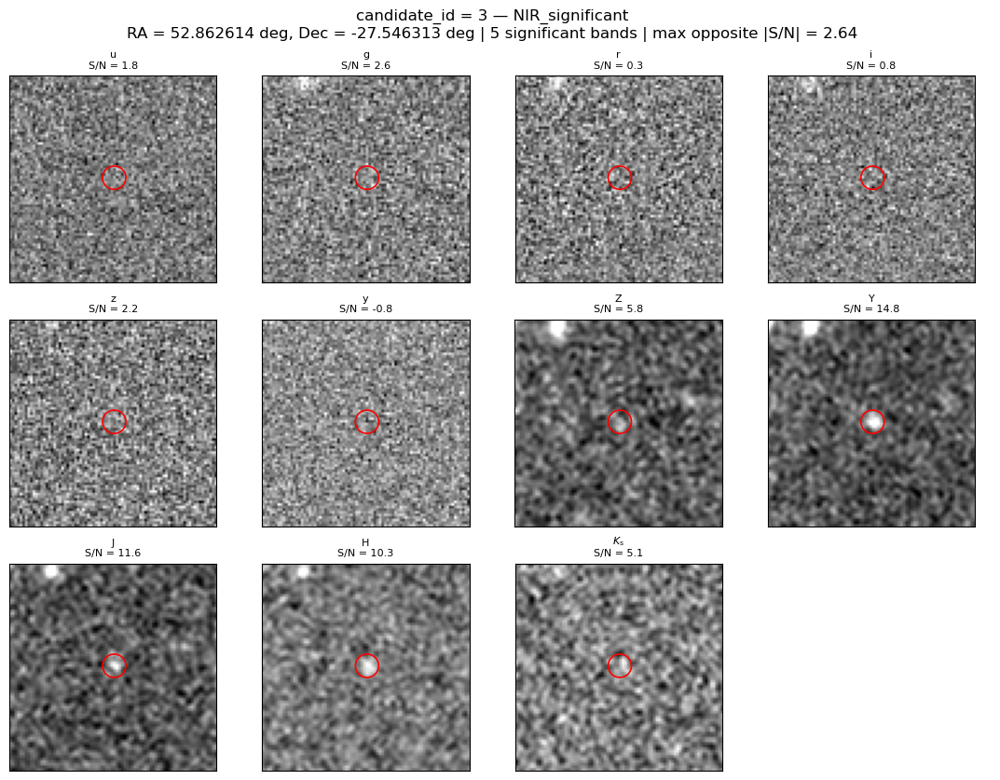

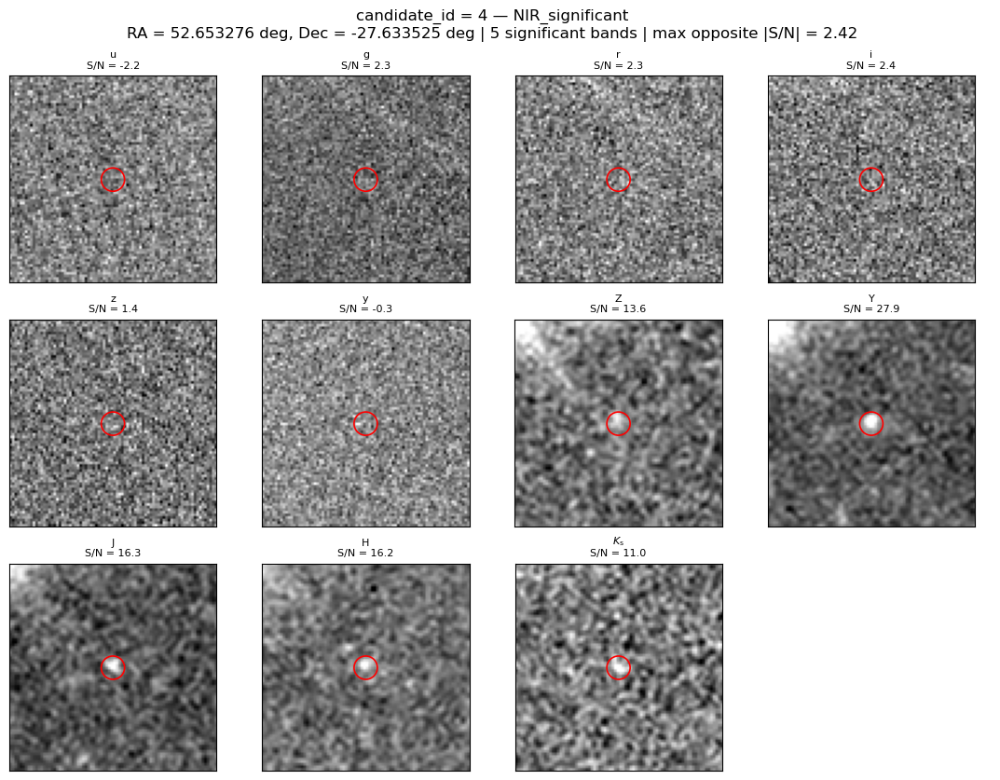

In [14]:
for candidate_index in range(
    len(final_examples)
):

    plot_candidate(
        final_examples,
        candidate_index,
        id_column="candidate_id",
    )

    plt.close("all")
    gc.collect()

### 8. Final extreme-source paper figure

The final paper figure shows the selected NIR- and optical-dominated
examples using the original coadd pixel values, with NO_DATA pixels
masked and without additional background subtraction or smoothing.

Several display stretches were tested, including linear, logarithmic,
power-law, and asinh scalings. Logarithmic and asinh stretches gave the
clearest results, with the final figure adopting an asinh stretch.

To improve the visibility of the compact sources, the displayed field
is reduced from the original 60-arcsec cutout to a central 25 x 25
arcsec region. The display normalization is nevertheless estimated from
a larger 80 x 80 arcsec region around each source, providing a more
robust estimate of the local background while retaining the tighter
zoom in the final figure.

Background cutout: 400 pix = 80.0 arcsec
Displayed cutout : 125 pix = 25.0 arcsec
Stretch: asinh


,candidate_id,sample,ra_deg,dec_deg
0,1,ComCam_significant,53.073812,-27.732826
1,3,NIR_significant,52.862614,-27.546313



Loading candidate 1
  u: (400, 400)
  g: (400, 400)
  r: (400, 400)
  i: (400, 400)
  z: (400, 400)
  y: (400, 400)
  Z: (400, 400)
  Y: (400, 400)
  J: (400, 400)
  H: (400, 400)
  K: (400, 400)

Loading candidate 3
  u: (400, 400)
  g: (400, 400)
  r: (400, 400)
  i: (400, 400)
  z: (400, 400)
  y: (400, 400)
  Z: (400, 400)
  Y: (400, 400)
  J: (400, 400)
  H: (400, 400)
  K: (400, 400)


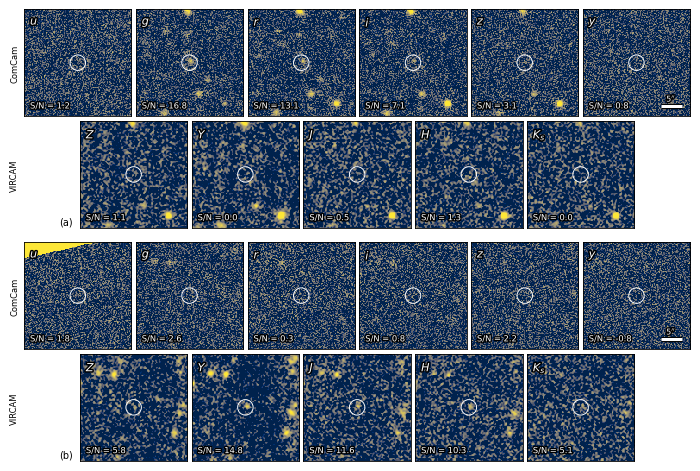


Saved PDF: data/image_products/dp1_extreme_optical_nir_examples_25arcsec_asinh_a0p05.pdf


In [15]:
# ============================================================
# FINAL EXTREME-SOURCE FIGURE (compact version)
# - original coadd values
# - NO_DATA masked
# - no background subtraction
# - no smoothing
# - large cutout for robust local normalization
# - smaller central cutout displayed in paper
# ============================================================

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib as mpl

from astropy.visualization import AsinhStretch, LogStretch, ImageNormalize
import lsst.daf.butler as dafButler
import lsst.geom as geom

mpl.rcParams["pdf.compression"] = 9

# ---------------------------
# Repositories
# ---------------------------
COMCAM_REPO = "dp1"
COMCAM_COLLECTION = "LSSTComCam/DP1"
COMCAM_DATASET_TYPE = "deep_coadd"

VIRCAM_REPO = "lsst-ir-fusion-dp1"
VIRCAM_DATASET_TYPE = "deepCoadd_calexp"
VIRCAM_PREFERRED_RUN = "u/ir-sare1/DRP/videoCoaddDetect/20260405T092826Z"

SKYMAP = "lsst_cells_v1"

# ---------------------------
# Bands
# ---------------------------
COMCAM_BANDS = ["u", "g", "r", "i", "z", "y"]
VIRCAM_BANDS = ["Z", "Y", "J", "H", "K"]
ALL_BANDS = COMCAM_BANDS + VIRCAM_BANDS

PANEL_LABELS = {
    "u": r"$u$", "g": r"$g$", "r": r"$r$", "i": r"$i$", "z": r"$z$", "y": r"$y$",
    "Z": r"$Z$", "Y": r"$Y$", "J": r"$J$", "H": r"$H$", "K": r"$K_s$"
}

# ---------------------------
# Display settings
# ---------------------------
CMAP_NAME = "cividis"
PIXEL_SCALE_ARCSEC = 0.2

BACKGROUND_SIZE_ARCSEC = 80.0
DISPLAY_SIZE_ARCSEC = 25.0      # change to 25.0 if preferred

BACKGROUND_CUTOUT_SIZE_PIX = int(round(BACKGROUND_SIZE_ARCSEC / PIXEL_SCALE_ARCSEC))
DISPLAY_CUTOUT_SIZE_PIX = int(round(DISPLAY_SIZE_ARCSEC / PIXEL_SCALE_ARCSEC))

STRETCH_TYPE = "asinh"          # "asinh" or "log"
ASINH_A = 0.05
LOG_A = 10.0

VMIN_SIGMA = -0.1
VMAX_SIGMA = 8.0

CIRCLE_RADIUS_PIX = 9.0
CIRCLE_LINEWIDTH = 0.7
SCALE_BAR_ARCSEC = 5.0

OUTDIR = Path("data/image_products")
OUTDIR.mkdir(parents=True, exist_ok=True)

stretch_tag = f"asinh_a{ASINH_A:.2f}".replace(".", "p") if STRETCH_TYPE == "asinh" else f"log_a{LOG_A:g}".replace(".", "p")
OUTPUT_PDF = OUTDIR / f"dp1_extreme_optical_nir_examples_{int(DISPLAY_SIZE_ARCSEC)}arcsec_{stretch_tag}.pdf"

print("Background cutout:", BACKGROUND_CUTOUT_SIZE_PIX, "pix =", BACKGROUND_SIZE_ARCSEC, "arcsec")
print("Displayed cutout :", DISPLAY_CUTOUT_SIZE_PIX, "pix =", DISPLAY_SIZE_ARCSEC, "arcsec")
print("Stretch:", STRETCH_TYPE)

# ---------------------------
# Selected candidates
# ---------------------------
examples = final_examples.set_index("candidate_id").loc[[1, 3]].reset_index()
display(examples[["candidate_id", "sample", "ra_deg", "dec_deg"]])

# ---------------------------
# Open Butlers
# ---------------------------
butler_comcam = dafButler.Butler(COMCAM_REPO, collections=COMCAM_COLLECTION)
butler_vista = dafButler.Butler(VIRCAM_REPO)
registry_vista = butler_vista.registry
skymap = butler_comcam.get("skyMap")

# ---------------------------
# Helper functions
# ---------------------------
def make_cutout_bbox(exposure, sky_position, size_pix):
    centre = geom.Point2I(exposure.getWcs().skyToPixel(sky_position))
    extent = geom.Extent2I(size_pix, size_pix)
    minimum = centre - extent // 2
    bbox = geom.Box2I(minimum, extent)
    if not exposure.getBBox().contains(bbox):
        raise ValueError("Requested cutout is not fully contained in exposure.")
    return bbox

def extract_cutout(exposure, sky_position, size_pix):
    cutout = exposure.getCutout(make_cutout_bbox(exposure, sky_position, size_pix))
    array = np.asarray(cutout.image.array, dtype=float).copy()
    mask_dict = cutout.mask.getMaskPlaneDict()
    if "NO_DATA" in mask_dict:
        bit = mask_dict["NO_DATA"]
        no_data = (np.asarray(cutout.mask.array, dtype=np.int64) & (1 << bit)) != 0
        array[no_data] = np.nan
    array[~np.isfinite(array)] = np.nan
    return array

def centre_crop(array, size_pix):
    ny, nx = array.shape
    y0, x0 = (ny - size_pix) // 2, (nx - size_pix) // 2
    return array[y0:y0 + size_pix, x0:x0 + size_pix]

def robust_sigma(values):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return np.nan
    med = np.median(values)
    mad = np.median(np.abs(values - med))
    return 1.4826 * mad

def get_stretch():
    if STRETCH_TYPE == "asinh":
        return AsinhStretch(a=ASINH_A)
    elif STRETCH_TYPE == "log":
        return LogStretch(a=LOG_A)
    else:
        raise ValueError(f"Unknown STRETCH_TYPE: {STRETCH_TYPE}")

def display_normalization(background_array, band):
    finite = np.asarray(background_array, dtype=float)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        raise ValueError(f"No finite pixels in {band}")
    median = np.median(finite)
    sigma = robust_sigma(finite)
    if not np.isfinite(sigma) or sigma <= 0:
        sigma = np.std(finite)
    vmin = median + VMIN_SIGMA * sigma
    vmax = median + VMAX_SIGMA * sigma
    return ImageNormalize(vmin=vmin, vmax=vmax, stretch=get_stretch(), clip=True)

def load_band(ra_deg, dec_deg, band):
    sky_position = geom.SpherePoint(ra_deg * geom.degrees, dec_deg * geom.degrees)
    tract_info = skymap.findTract(sky_position)
    patch_info = tract_info.findPatch(sky_position)
    tract = tract_info.getId()
    patch = patch_info.getSequentialIndex()
    data_id = {"skymap": SKYMAP, "tract": tract, "patch": patch}

    if band in COMCAM_BANDS:
        refs = list(set(butler_comcam.query_datasets(COMCAM_DATASET_TYPE, tract=tract, patch=patch, where=f"band = '{band}'")))
        if len(refs) == 0:
            raise RuntimeError(f"No ComCam {band} coadd")
        exposure = butler_comcam.get(refs[0])
    else:
        refs = list(set(registry_vista.queryDatasets(VIRCAM_DATASET_TYPE, dataId=data_id, collections=[VIRCAM_PREFERRED_RUN])))
        refs = [ref for ref in refs if str(ref.dataId["band"]) == band]
        if len(refs) == 0:
            raise RuntimeError(f"No VIRCAM {band} coadd")
        exposure = butler_vista.get(refs[0])

    return extract_cutout(exposure, sky_position, BACKGROUND_CUTOUT_SIZE_PIX)

# ---------------------------
# Load cutouts
# ---------------------------
cutout_arrays = {}
for candidate_index, row in examples.iterrows():
    cutout_arrays[candidate_index] = {}
    print(f"\nLoading candidate {int(row['candidate_id'])}")
    for band in ALL_BANDS:
        try:
            arr = load_band(float(row["ra_deg"]), float(row["dec_deg"]), band)
            cutout_arrays[candidate_index][band] = arr
            print(f"  {band}: {arr.shape}")
        except Exception as exc:
            print(f"  {band}: FAILED {exc}")
            cutout_arrays[candidate_index][band] = None

# ---------------------------
# Figure geometry
# ---------------------------
fig_w, fig_h = 7.4, 5.55
fig = plt.figure(figsize=(fig_w, fig_h))

label_left = 0.072
panel_left, panel_right = 0.085, 0.985
panel_gap_x = 0.006
panel_w = (panel_right - panel_left - 5 * panel_gap_x) / 6.0
panel_h = panel_w * fig_w / fig_h

row_gap = 0.008
candidate_gap = 0.025

bottom_vista_2 = 0.055
bottom_comcam_2 = bottom_vista_2 + panel_h + row_gap
bottom_vista_1 = bottom_comcam_2 + panel_h + candidate_gap
bottom_comcam_1 = bottom_vista_1 + panel_h + row_gap

positions = [(bottom_comcam_1, bottom_vista_1), (bottom_comcam_2, bottom_vista_2)]
axes = {}

for candidate_index, (comcam_y, vista_y) in enumerate(positions):
    for i, band in enumerate(COMCAM_BANDS):
        x0 = panel_left + i * (panel_w + panel_gap_x)
        axes[(candidate_index, band)] = fig.add_axes([x0, comcam_y, panel_w, panel_h])

    vista_left = panel_left + 0.5 * (panel_w + panel_gap_x)
    for i, band in enumerate(VIRCAM_BANDS):
        x0 = vista_left + i * (panel_w + panel_gap_x)
        axes[(candidate_index, band)] = fig.add_axes([x0, vista_y, panel_w, panel_h])

# ---------------------------
# Draw panels
# ---------------------------
for candidate_index, row in examples.iterrows():
    for band in ALL_BANDS:
        ax = axes[(candidate_index, band)]
        full_array = cutout_arrays[candidate_index][band]

        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_linewidth(0.6)
            spine.set_color("black")

        if full_array is None:
            ax.set_facecolor("0.90")
            continue

        norm = display_normalization(full_array, band)
        array = centre_crop(full_array, DISPLAY_CUTOUT_SIZE_PIX)

        ax.set_facecolor(plt.get_cmap(CMAP_NAME)(0.0))
        ax.imshow(array, origin="lower", cmap=CMAP_NAME, norm=norm, interpolation="none")

        height, width = array.shape
        ax.set_xlim(-0.5, width - 0.5)
        ax.set_ylim(-0.5, height - 0.5)
        ax.set_aspect("equal", adjustable="box")

        ax.text(0.055, 0.93, PANEL_LABELS[band], transform=ax.transAxes,
                ha="left", va="top", color="white", fontsize=8,
                path_effects=[pe.withStroke(linewidth=2.1, foreground="black")])

        snr_column = f"snr_ComCam_{band}" if band in COMCAM_BANDS else f"snr_VIRCAM_{band}"
        try:
            snr = float(row[snr_column])
        except Exception:
            snr = np.nan

        if int(row["candidate_id"]) == 1 and band == "i":
            snr_text = r"S/N = 7.1"
        elif np.isfinite(snr):
            if abs(snr) < 0.05:
                snr = 0.0
            snr_text = f"S/N = {snr:.1f}"
        else:
            snr_text = "S/N = --"

        ax.text(0.055, 0.055, snr_text, transform=ax.transAxes,
                ha="left", va="bottom", color="white", fontsize=6.0,
                path_effects=[pe.withStroke(linewidth=1.9, foreground="black")])

        cx, cy = 0.5 * (width - 1), 0.5 * (height - 1)
        circle = plt.Circle((cx, cy), CIRCLE_RADIUS_PIX, facecolor="none", edgecolor="white", linewidth=CIRCLE_LINEWIDTH)
        ax.add_patch(circle)

# ---------------------------
# Instrument labels
# ---------------------------
for comcam_y, vista_y in positions:
    fig.text(label_left, comcam_y + 0.5 * panel_h, "ComCam", rotation=90, ha="center", va="center", fontsize=6)
    fig.text(label_left, vista_y + 0.5 * panel_h, "VIRCAM", rotation=90, ha="center", va="center", fontsize=6)

# ---------------------------
# Scale bars
# ---------------------------
def add_scale_bar(ax):
    bar_length_pix = SCALE_BAR_ARCSEC / PIXEL_SCALE_ARCSEC
    display_size_pix = DISPLAY_CUTOUT_SIZE_PIX
    bar_x1 = 0.92 * display_size_pix
    bar_x0 = bar_x1 - bar_length_pix
    bar_y = 0.09 * display_size_pix

    ax.plot([bar_x0, bar_x1], [bar_y, bar_y], color="white", linewidth=2.2, solid_capstyle="butt",
            path_effects=[pe.withStroke(linewidth=3.8, foreground="black")])

    ax.text(0.5 * (bar_x0 + bar_x1), bar_y + 0.025 * display_size_pix,
            rf"{SCALE_BAR_ARCSEC:g}" + r"$^{\prime\prime}$",
            ha="center", va="bottom", color="white", fontsize=5.7,
            path_effects=[pe.withStroke(linewidth=2.0, foreground="black")])

add_scale_bar(axes[(0, "y")])
add_scale_bar(axes[(1, "y")])

# ---------------------------
# (a), (b) labels
# ---------------------------
for label, key in [("(a)", (0, "Z")), ("(b)", (1, "Z"))]:
    pos = axes[key].get_position()
    fig.text(pos.x0 - 0.010, pos.y0 + 0.002, label, ha="right", va="bottom", fontsize=7)

# ---------------------------
# Save
# ---------------------------
fig.savefig(OUTPUT_PDF, format="pdf", bbox_inches="tight", pad_inches=0.025)
plt.show()
print("\nSaved PDF:", OUTPUT_PDF)

### 9. Varadaraj et al. (2023) high-redshift candidates

We inspect the four published $z\sim7$ candidates from
Varadaraj et al. (2023) that have primary counterparts within
1 arcsec in the fused DP1 catalogue.

The source positions and forced-photometry S/N values are imported
from the statistics notebook. The cutouts therefore use exactly the
same catalogue counterparts and photometric measurements used in the
cross-match analysis.

Matched Varadaraj candidates: 4


,id,z_phot,catalog_row,match_sep_arcsec,n_ComCam_5sig,n_VIRCAM_5sig,valid_griz,valid_YJHKs,NIR_extreme
0,VIDEO_z7_23,6.52,481087,0.185354,0.0,4.0,True,True,True
1,VIDEO_z7_24,6.57,278892,0.154993,0.0,2.0,False,True,False
2,VIDEO_z7_25,6.59,616472,0.242628,0.0,0.0,False,False,False
3,VIDEO_z7_28,7.38,566087,0.053069,0.0,2.0,False,True,False


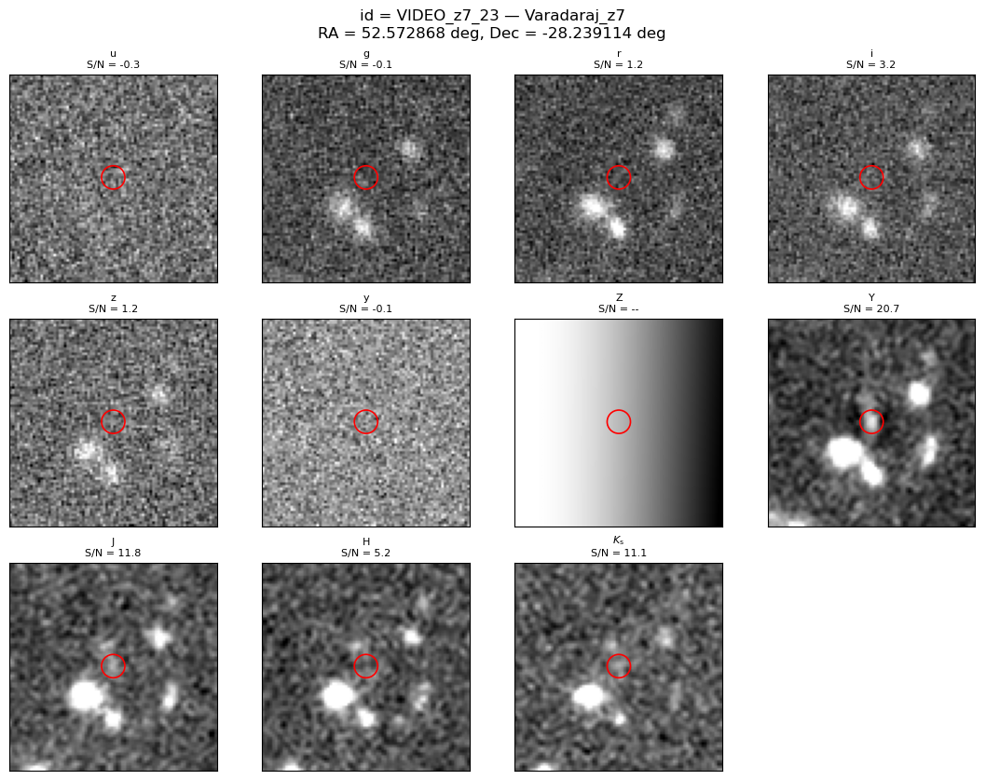

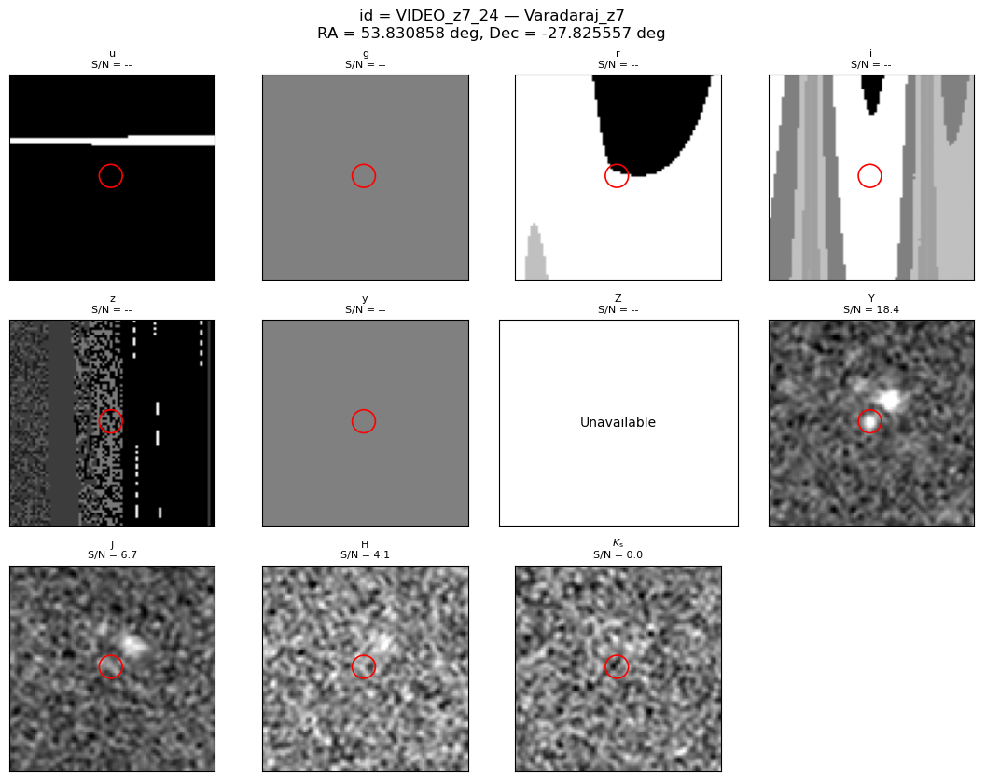

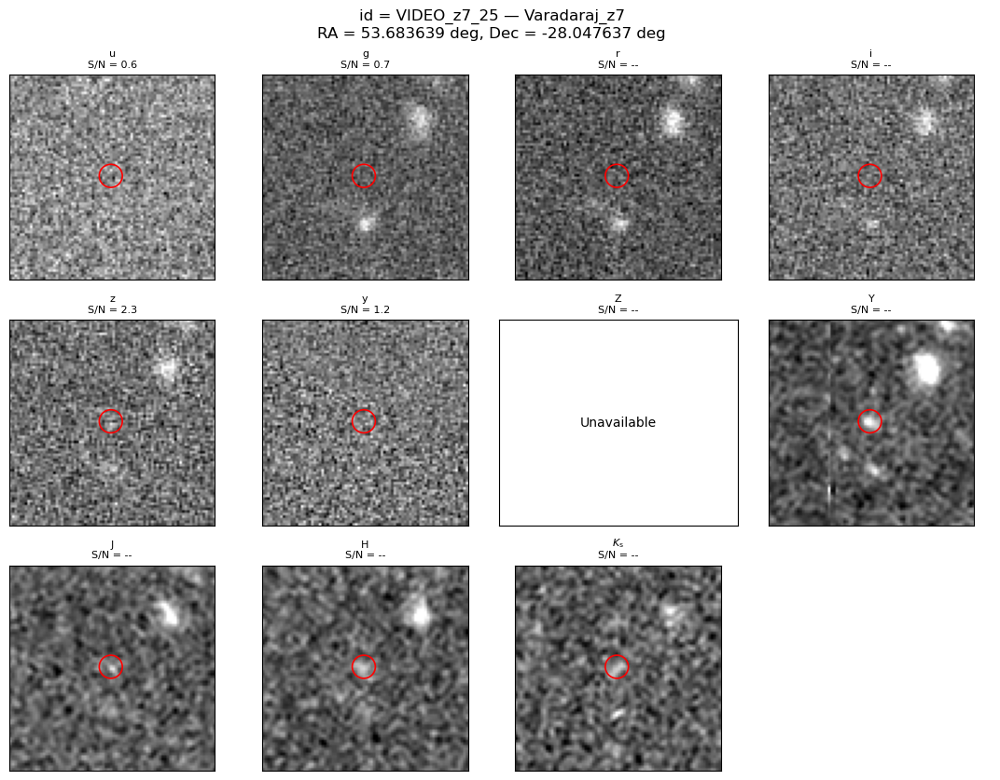

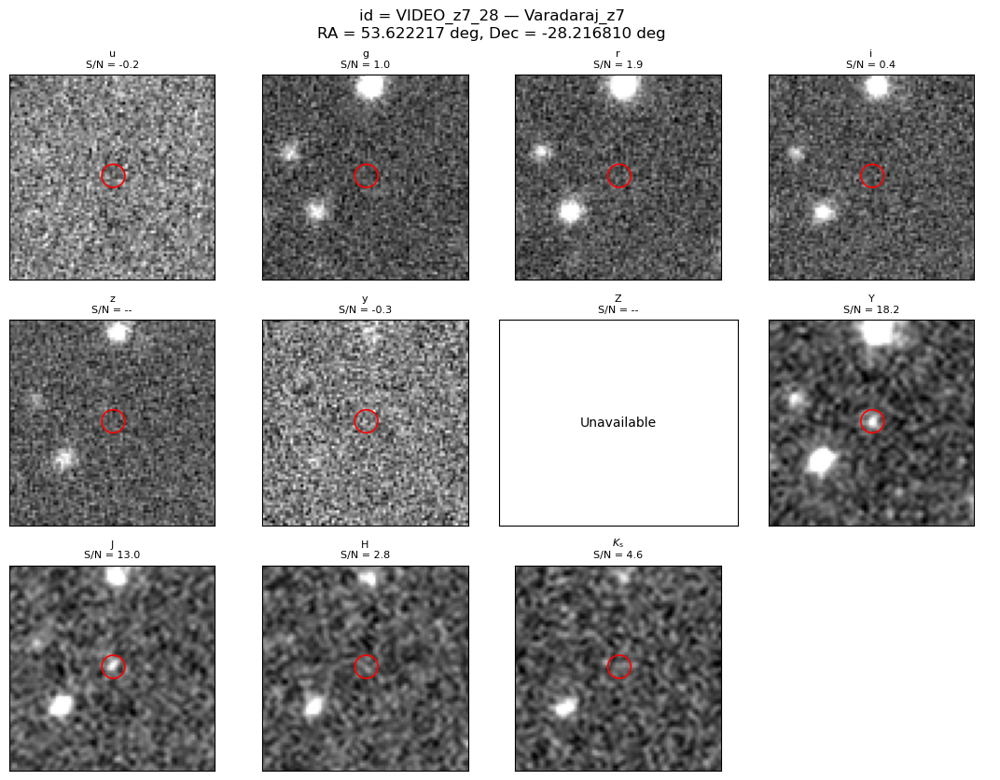

In [16]:
# ============================================================
# Varadaraj et al. (2023) matched z~7 candidates
# ============================================================

VARADARAJ_FILE = Path(
    "data/DP1_varadaraj_matched_forced.csv"
)


varadaraj_dp1 = pd.read_csv(
    VARADARAJ_FILE
)


print(
    "Matched Varadaraj candidates:",
    len(varadaraj_dp1),
)


display(
    varadaraj_dp1[
        [
            "id",
            "z_phot",
            "catalog_row",
            "match_sep_arcsec",
            "n_ComCam_5sig",
            "n_VIRCAM_5sig",
            "valid_griz",
            "valid_YJHKs",
            "NIR_extreme",
        ]
    ]
)


# ------------------------------------------------------------
# Show eleven-band cutouts for all matched candidates
# ------------------------------------------------------------

for candidate_index in range(
    len(varadaraj_dp1)
):

    plot_candidate(
        varadaraj_dp1,
        candidate_index,
        id_column="id",
    )

    plt.close("all")
    gc.collect()

In [17]:
# ============================================================
# Information of candidates
# ============================================================

table = (
    varadaraj_dp1[
        [
            "id",
            "published_ra_deg",
            "published_dec_deg",
            "z_phot",
            "match_sep_arcsec",
        ]
    ]
    .copy()
)


table = table.rename(
    columns={
        "published_ra_deg":
            "RA_deg",
        "published_dec_deg":
            "Dec_deg",
    }
)


TABLE_FILE = Path(
    "data/Varadaraj_z7_candidates.csv"
)

table.to_csv(
    TABLE_FILE,
    index=False,
)


display(
    table
)

print("\nSaved:")
print(TABLE_FILE)

,id,RA_deg,Dec_deg,z_phot,match_sep_arcsec
0,VIDEO_z7_23,52.572917,-28.239086,6.52,0.185354
1,VIDEO_z7_24,53.830875,-27.825597,6.57,0.154993
2,VIDEO_z7_25,53.683667,-28.047700,6.59,0.242628
3,VIDEO_z7_28,53.622208,-28.216797,7.38,0.053069



Saved:
data/Varadaraj_z7_candidates.csv


### 10. Varadaraj high-redshift paper figure


Paper source: VIDEO_z7_23
RA, Dec: 52.57286808837293 -28.23911418123376
  u: (400, 400)
  g: (400, 400)
  r: (400, 400)
  i: (400, 400)
  z: (400, 400)
  y: (400, 400)
  Y: (400, 400)
  J: (400, 400)
  H: (400, 400)
  K: (400, 400)
Saved: data/image_products/dp1_varadaraj_highz_example.pdf


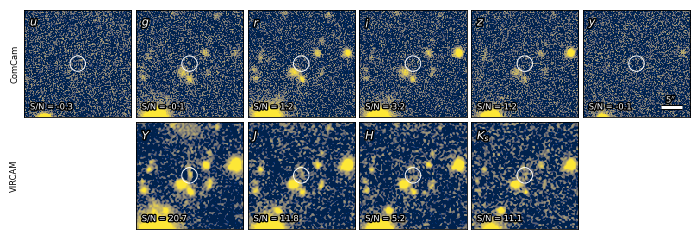

In [18]:
# ============================================================
# VARADARAJ HIGH-REDSHIFT PAPER FIGURE
#
# One candidate:
#     VIDEO_z7_23
#
# Row 1: ComCam ugrizy
# Row 2: VIRCAM YJHKs
#
# The VIRCAM Z band is excluded because no usable image
# is available at the position of this source.
#
# Display treatment, panel dimensions, annotations and scale
# bar follow the final extreme-source paper figure.
# ============================================================


# ------------------------------------------------------------
# Bands shown in this figure
# ------------------------------------------------------------

PAPER_VIRCAM_BANDS = [
    "Y",
    "J",
    "H",
    "K",
]


PAPER_BANDS = (
    COMCAM_BANDS
    + PAPER_VIRCAM_BANDS
)


# ------------------------------------------------------------
# Select the Varadaraj source
# ------------------------------------------------------------

PAPER_VARADARAJ_ID = (
    "VIDEO_z7_23"
)


paper_matches = (
    varadaraj_dp1[
        varadaraj_dp1["id"]
        == PAPER_VARADARAJ_ID
    ]
)


if len(paper_matches) != 1:

    raise ValueError(
        f"Expected exactly one source with "
        f"id={PAPER_VARADARAJ_ID}, "
        f"but found {len(paper_matches)}."
    )


paper_source = (
    paper_matches.iloc[0]
)


print(
    "\nPaper source:",
    paper_source["id"],
)

print(
    "RA, Dec:",
    paper_source["ra_deg"],
    paper_source["dec_deg"],
)


# ============================================================
# Load ten image cutouts
# ============================================================

arrays = {}


for band in PAPER_BANDS:

    try:

        array = load_band(
            float(
                paper_source["ra_deg"]
            ),
            float(
                paper_source["dec_deg"]
            ),
            band,
        )


        # ----------------------------------------------------
        # Check that the cutout contains usable pixels
        # ----------------------------------------------------

        finite_values = (
            np.ma.array(
                array,
                copy=False,
            )
            .compressed()
        )


        finite_values = (
            finite_values[
                np.isfinite(
                    finite_values
                )
            ]
        )


        if finite_values.size == 0:

            arrays[band] = None

            print(
                f"  {band}: no finite pixels"
            )

            continue


        arrays[band] = array


        print(
            f"  {band}:",
            array.shape,
        )


    except Exception as exc:

        arrays[band] = None

        print(
            f"  {band}: FAILED",
            exc,
        )


# ============================================================
# Figure geometry
#
# Final extreme-source figure:
#     7.4 x 5.55 inch
#     four rows
#
# This figure:
#     7.4 x 2.775 inch
#     two rows
#
# This keeps the same physical panel size, horizontal spacing
# and vertical separation as the extreme-source figure.
# ============================================================

fig_w = 7.4
fig_h = 2.775


fig = plt.figure(
    figsize=(
        fig_w,
        fig_h,
    )
)


# ------------------------------------------------------------
# Horizontal geometry
# ------------------------------------------------------------

label_left = 0.072

panel_left = 0.085
panel_right = 0.985

panel_gap_x = 0.006


panel_w = (
    panel_right
    - panel_left
    - 5 * panel_gap_x
) / 6.0


panel_h = (
    panel_w
    * fig_w
    / fig_h
)


# ------------------------------------------------------------
# Vertical geometry
# ------------------------------------------------------------

vertical_scale = (
    5.55
    / fig_h
)


row_gap = (
    0.008
    * vertical_scale
)


bottom_vista = (
    0.055
    * vertical_scale
)


bottom_comcam = (
    bottom_vista
    + panel_h
    + row_gap
)


# ============================================================
# Create axes
# ============================================================

axes = {}


# ------------------------------------------------------------
# Row 1: six ComCam panels
# ------------------------------------------------------------

for i, band in enumerate(
    COMCAM_BANDS
):

    x0 = (
        panel_left
        + i
        * (
            panel_w
            + panel_gap_x
        )
    )


    axes[band] = fig.add_axes(
        [
            x0,
            bottom_comcam,
            panel_w,
            panel_h,
        ]
    )


# ------------------------------------------------------------
# Row 2: four centred VIRCAM panels
# ------------------------------------------------------------

comcam_total_width = (
    6 * panel_w
    + 5 * panel_gap_x
)


vista_total_width = (
    4 * panel_w
    + 3 * panel_gap_x
)


vista_left = (
    panel_left
    + 0.5
    * (
        comcam_total_width
        - vista_total_width
    )
)


for i, band in enumerate(
    PAPER_VIRCAM_BANDS
):

    x0 = (
        vista_left
        + i
        * (
            panel_w
            + panel_gap_x
        )
    )


    axes[band] = fig.add_axes(
        [
            x0,
            bottom_vista,
            panel_w,
            panel_h,
        ]
    )


# ============================================================
# Draw panels
# ============================================================

for band in PAPER_BANDS:

    ax = axes[band]

    array = arrays[band]


    ax.set_xticks([])
    ax.set_yticks([])


    for spine in (
        ax.spines.values()
    ):

        spine.set_linewidth(
            0.6
        )

        spine.set_color(
            "black"
        )


    # --------------------------------------------------------
    # Formal forced-photometry S/N
    # --------------------------------------------------------

    if band in COMCAM_BANDS:

        snr_column = (
            f"raw_snr_ComCam_{band}"
        )

    else:

        snr_column = (
            f"raw_snr_VIRCAM_{band}"
        )


    try:

        snr = float(
            paper_source[
                snr_column
            ]
        )

    except Exception:

        snr = np.nan


    if np.isfinite(snr):

        if abs(snr) < 0.05:

            snr = 0.0


        snr_text = (
            f"S/N = {snr:.1f}"
        )

    else:

        snr_text = (
            "S/N = --"
        )


    # --------------------------------------------------------
    # Missing image
    # --------------------------------------------------------

    if array is None:

        ax.set_facecolor(
            "0.90"
        )


        ax.text(
            0.055,
            0.93,
            PANEL_LABELS[band],
            transform=ax.transAxes,
            ha="left",
            va="top",
            color="black",
            fontsize=9.5,
        )


        ax.text(
            0.055,
            0.055,
            "S/N = --",
            transform=ax.transAxes,
            ha="left",
            va="bottom",
            color="black",
            fontsize=7.0,
        )


        continue


    # --------------------------------------------------------
    # Same normalization as the extreme-source figure
    # --------------------------------------------------------

    norm = display_normalization(array, band)

    display_array = centre_crop(
       array,
       DISPLAY_CUTOUT_SIZE_PIX,
    )

    ax.imshow(
       display_array,
       origin="lower",
       cmap=CMAP_NAME,
       norm=norm,
       interpolation="none",
    )

    height, width = display_array.shape


    ax.set_xlim(
        -0.5,
        width - 0.5,
    )


    ax.set_ylim(
        -0.5,
        height - 0.5,
    )


    ax.set_aspect(
        "equal",
        adjustable="box",
    )


    # --------------------------------------------------------
    # Band label
    # --------------------------------------------------------

    ax.text(
        0.055,
        0.93,
        PANEL_LABELS[band],
        transform=ax.transAxes,
        ha="left",
        va="top",
        color="white",
        fontsize=8,
        path_effects=[
            pe.withStroke(
                linewidth=2.1,
                foreground="black",
            )
        ],
    )


    # --------------------------------------------------------
    # S/N annotation
    # --------------------------------------------------------

    ax.text(
        0.055,
        0.055,
        snr_text,
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        color="white",
        fontsize=6.0,
        path_effects=[
            pe.withStroke(
                linewidth=1.9,
                foreground="black",
            )
        ],
    )


    # --------------------------------------------------------
    # Target circle
    # --------------------------------------------------------

    centre = 0.5 * (width - 1)


    circle = plt.Circle(
        (
            centre,
            centre,
        ),
        CIRCLE_RADIUS_PIX,
        facecolor="none",
        edgecolor="white",
        linewidth=CIRCLE_LINEWIDTH,
    )


    ax.add_patch(
        circle
    )


# ============================================================
# Instrument labels
# ============================================================

fig.text(
    label_left,
    bottom_comcam
    + 0.5
    * panel_h,
    "ComCam",
    rotation=90,
    ha="center",
    va="center",
    fontsize=6,
)


fig.text(
    label_left,
    bottom_vista
    + 0.5
    * panel_h,
    "VIRCAM",
    rotation=90,
    ha="center",
    va="center",
    fontsize=6,
)


# ============================================================
# 5-arcsec scale bar
#
# Same position and style as the extreme-source figure:
# rightmost ComCam y panel.
# ============================================================

def add_scale_bar(ax):

    bar_length_pix = (
        SCALE_BAR_ARCSEC
        / PIXEL_SCALE_ARCSEC
    )


    bar_x1 = (
        0.92
        * DISPLAY_CUTOUT_SIZE_PIX
    )


    bar_x0 = (
        bar_x1
        - bar_length_pix
    )


    bar_y = (
        0.09
        * DISPLAY_CUTOUT_SIZE_PIX
    )


    ax.plot(
        [
            bar_x0,
            bar_x1,
        ],
        [
            bar_y,
            bar_y,
        ],
        color="white",
        linewidth=2.2,
        solid_capstyle="butt",
        path_effects=[
            pe.withStroke(
                linewidth=3.8,
                foreground="black",
            )
        ],
    )


    ax.text(
        0.5
        * (
            bar_x0
            + bar_x1
        ),
        bar_y
        + 0.025
        * DISPLAY_CUTOUT_SIZE_PIX,
        (
            rf"{SCALE_BAR_ARCSEC:g}"
            r"$^{\prime\prime}$"
        ),
        ha="center",
        va="bottom",
        color="white",
        fontsize=6.0,
        path_effects=[
            pe.withStroke(
                linewidth=2.0,
                foreground="black",
            )
        ],
    )


add_scale_bar(
    axes["y"]
)


# ============================================================
# Save paper figure
# ============================================================

VARADARAJ_PAPER_PDF = Path(
    "data/image_products/"
    "dp1_varadaraj_highz_example.pdf"
)


VARADARAJ_PAPER_PDF.parent.mkdir(
    parents=True,
    exist_ok=True,
)


fig.savefig(
    VARADARAJ_PAPER_PDF,
    format="pdf",
    bbox_inches="tight",
    pad_inches=0.025,
)


print(
    "Saved:",
    VARADARAJ_PAPER_PDF,
)


plt.show()

### 11. Local ComCam z-band depth from catalogue PSF-flux uncertainties


In [19]:
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u

# ------------------------------------------------------------
# Varadaraj position -> tract / patch
# ------------------------------------------------------------
ra0 = float(paper_source["ra_deg"])
dec0 = float(paper_source["dec_deg"])

skypos = geom.SpherePoint(ra0 * geom.degrees, dec0 * geom.degrees)
tract_info = skymap.findTract(skypos)
patch_info = tract_info.findPatch(skypos)

tract = tract_info.getId()
patch = patch_info.getSequentialIndex()

print("Tract / patch:", tract, patch)

# ------------------------------------------------------------
# Load only required columns from DP1 Object catalogue
# ------------------------------------------------------------
cols = ["coord_ra", "coord_dec", "patch", "z_psfFlux", "z_psfFluxErr"]

obj = butler_comcam.get(
    "object",
    dataId={"skymap": SKYMAP, "tract": tract},
    parameters={"columns": cols},
)

ra = np.asarray(obj["coord_ra"], dtype=float)
dec = np.asarray(obj["coord_dec"], dtype=float)
zflux = np.asarray(obj["z_psfFlux"], dtype=float)
zerr = np.asarray(obj["z_psfFluxErr"], dtype=float)
obj_patch = np.asarray(obj["patch"])

# ------------------------------------------------------------
# Same patch + within 2 arcmin of Varadaraj candidate
# ------------------------------------------------------------
c0 = SkyCoord(ra0 * u.deg, dec0 * u.deg)
cc = SkyCoord(ra * u.deg, dec * u.deg)
sep = cc.separation(c0).arcmin

snr = zflux / zerr

select = (
    (obj_patch.astype(str) == str(patch))
    & np.isfinite(zflux)
    & np.isfinite(zerr)
    & (zerr > 0)
    & (sep < 2.0)
    # Low-S/N objects give a better estimate of sky-dominated uncertainty
    & (np.abs(snr) < 5.0)
)

err_local = zerr[select]

print("Number of local measurements:", len(err_local))

# ------------------------------------------------------------
# Robustly remove unusual flux-error values
# ------------------------------------------------------------
med = np.median(err_local)
mad = np.median(np.abs(err_local - med))
sigma_mad = 1.4826 * mad

good = np.abs(err_local - med) < 3.0 * sigma_mad
err_local = err_local[good]

median_err = np.median(err_local)

# ------------------------------------------------------------
# Local 5-sigma PSF depth
# Fluxes are in nJy: AB = 31.4 - 2.5 log10(f_nJy)
# ------------------------------------------------------------
flux_5sigma = 5.0 * median_err
mag_5sigma = 31.4 - 2.5 * np.log10(flux_5sigma)

print("\nAfter clipping:", len(err_local))
print(f"Median z PSF flux uncertainty = {median_err:.3f} nJy")
print(f"5-sigma z flux limit          = {flux_5sigma:.3f} nJy")
print(f"Local ComCam z 5-sigma depth  = {mag_5sigma:.3f} AB mag")

Tract / patch: 5063 7
Number of local measurements: 1032

After clipping: 1032
Median z PSF flux uncertainty = 105.293 nJy
5-sigma z flux limit          = 526.465 nJy
Local ComCam z 5-sigma depth  = 24.597 AB mag



As a first estimate of the local ComCam z-band point-source depth around the Varadaraj candidate VIDEO_z7_23, we used nearby low-S/N catalogue measurements in the same tract and patch (5063/7), within 2 arcmin of the candidate. The median z-band PSF-flux uncertainty for 1,032 usable measurements is 105.3 nJy, corresponding to a 5σ flux limit of 526.5 nJy.

**Local 5σ z-band depth ≈ 24.60 AB mag**

This provides a catalogue-based estimate of the typical local PSF point-source depth.

### 12. Local ComCam z-band depth from empty apertures

In [20]:
import numpy as np

# ============================================================
# Local ComCam z-band depth for Varadaraj candidate
# 2" diameter empty apertures
# ============================================================

ra0 = float(paper_source["ra_deg"])
dec0 = float(paper_source["dec_deg"])

PIXEL_SCALE = 0.2          # arcsec/pixel
AP_DIAMETER = 2.0          # arcsec
AP_RADIUS_PIX = (AP_DIAMETER / 2.0) / PIXEL_SCALE   # = 5 pix
DEPTH_REGION_ARCSEC = 80.0
N_RANDOM = 5000
RNG_SEED = 12345

# ------------------------------------------------------------
# Find tract / patch and load ComCam z coadd
# ------------------------------------------------------------

skypos = geom.SpherePoint(ra0 * geom.degrees, dec0 * geom.degrees)

tract_info = skymap.findTract(skypos)
patch_info = tract_info.findPatch(skypos)

tract = tract_info.getId()
patch = patch_info.getSequentialIndex()

refs = list(set(
    butler_comcam.query_datasets(
        COMCAM_DATASET_TYPE,
        tract=tract,
        patch=patch,
        where="band = 'z'",
    )
))

if len(refs) == 0:
    raise RuntimeError("No ComCam z-band coadd found.")

exp = butler_comcam.get(refs[0])

# ------------------------------------------------------------
# Extract 80" x 80" region
# ------------------------------------------------------------

size_pix = int(round(DEPTH_REGION_ARCSEC / PIXEL_SCALE))
bbox = make_cutout_bbox(exp, skypos, size_pix)
cutout = exp.getCutout(bbox)

image = np.asarray(cutout.image.array, dtype=float)
mask = np.asarray(cutout.mask.array, dtype=np.int64)

ny, nx = image.shape

print("Tract / patch:", tract, patch)
print("Depth region:", DEPTH_REGION_ARCSEC, "arcsec")
print("Aperture diameter:", AP_DIAMETER, "arcsec")

# ------------------------------------------------------------
# Construct bad-pixel/source mask
# ------------------------------------------------------------

mask_dict = cutout.mask.getMaskPlaneDict()

reject_planes = [
    "NO_DATA",
    "BAD",
    "SAT",
    "EDGE",
    "CR",
    "DETECTED",
    "DETECTED_NEGATIVE",
]

reject_bits = 0

for plane in reject_planes:
    if plane in mask_dict:
        reject_bits |= (1 << mask_dict[plane])

bad = (~np.isfinite(image)) | ((mask & reject_bits) != 0)

# ------------------------------------------------------------
# Robust local sky from blank pixels
# ------------------------------------------------------------

sky_pixels = image[~bad]

sky_median = np.median(sky_pixels)

print(f"Local sky median = {sky_median:.4f} nJy/pixel")

# ------------------------------------------------------------
# Circular aperture offsets
# ------------------------------------------------------------

r = int(np.ceil(AP_RADIUS_PIX))

yy, xx = np.mgrid[-r:r+1, -r:r+1]

ap_mask = (
    xx**2 + yy**2
    <= AP_RADIUS_PIX**2
)

dy = yy[ap_mask]
dx = xx[ap_mask]

n_ap_pix = len(dx)

print("Pixels per aperture:", n_ap_pix)

# ------------------------------------------------------------
# Random EMPTY apertures
# ------------------------------------------------------------

rng = np.random.default_rng(RNG_SEED)

margin = r + 1

empty_fluxes = []

for _ in range(N_RANDOM):

    x = rng.integers(margin, nx - margin)
    y = rng.integers(margin, ny - margin)

    ap_bad = bad[y + dy, x + dx]

    # Require completely clean aperture
    if np.any(ap_bad):
        continue

    values = image[y + dy, x + dx]

    flux = np.sum(
        values - sky_median
    )

    empty_fluxes.append(flux)


empty_fluxes = np.asarray(empty_fluxes)

print("Accepted empty apertures:", len(empty_fluxes))

if len(empty_fluxes) < 100:
    raise RuntimeError(
        "Too few clean empty apertures. "
        "Increase DEPTH_REGION_ARCSEC."
    )

# ------------------------------------------------------------
# Robust clipping of empty-aperture distribution
# ------------------------------------------------------------

for _ in range(3):

    med = np.median(empty_fluxes)

    mad = np.median(
        np.abs(empty_fluxes - med)
    )

    sigma = 1.4826 * mad

    keep = (
        np.abs(empty_fluxes - med)
        < 3.0 * sigma
    )

    empty_fluxes = empty_fluxes[keep]

# Robust 1-sigma aperture noise
median_empty = np.median(empty_fluxes)

mad_empty = np.median(
    np.abs(empty_fluxes - median_empty)
)

sigma_ap = 1.4826 * mad_empty

# ------------------------------------------------------------
# 5-sigma limiting magnitude
# ------------------------------------------------------------

flux_5sigma = 5.0 * sigma_ap

mag_5sigma = (
    31.4
    - 2.5 * np.log10(flux_5sigma)
)

# ------------------------------------------------------------
# Forced 2" aperture at exact candidate position
# ------------------------------------------------------------

centre_parent = cutout.getWcs().skyToPixel(skypos)

# Convert parent-image coordinates to cutout-array coordinates
cut_bbox = cutout.getBBox()

xc = int(round(centre_parent.getX() - cut_bbox.getMinX()))
yc = int(round(centre_parent.getY() - cut_bbox.getMinY()))

print("Candidate position in cutout:", xc, yc)

candidate_values = image[
    yc + dy,
    xc + dx
]

candidate_flux = np.sum(
    candidate_values - sky_median
)

candidate_snr = candidate_flux / sigma_ap

# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

print("\n==============================================")
print("ComCam z local depth — Varadaraj VIDEO_z7_23")
print("==============================================")

print(f"Clean empty apertures : {len(empty_fluxes)}")
print(f"1-sigma aperture noise: {sigma_ap:.3f} nJy")
print(f"5-sigma flux limit    : {flux_5sigma:.3f} nJy")
print(f"5-sigma depth         : {mag_5sigma:.3f} AB mag")

print("\nCandidate forced 2\" aperture:")
print(f"Flux                  : {candidate_flux:.3f} nJy")
print(f"S/N                   : {candidate_snr:.2f}")

if candidate_flux > 0:
    candidate_mag = 31.4 - 2.5 * np.log10(candidate_flux)
    print(f"Formal aperture mag   : {candidate_mag:.3f} AB")
else:
    print("Formal aperture mag   : undefined (negative flux)")

if candidate_snr < 5:
    print(f"\nCandidate is NOT detected at 5 sigma in ComCam z.")
    print(f"Corresponding local limit: z > {mag_5sigma:.2f} AB")
else:
    print("\nCandidate is >=5 sigma in the forced ComCam z aperture.")

Tract / patch: 5063 7
Depth region: 80.0 arcsec
Aperture diameter: 2.0 arcsec
Local sky median = 0.2103 nJy/pixel
Pixels per aperture: 81
Accepted empty apertures: 3696
Candidate position in cutout: 200 200

ComCam z local depth — Varadaraj VIDEO_z7_23
Clean empty apertures : 3672
1-sigma aperture noise: 121.372 nJy
5-sigma flux limit    : 606.862 nJy
5-sigma depth         : 24.442 AB mag

Candidate forced 2" aperture:
Flux                  : 211.315 nJy
S/N                   : 1.74
Formal aperture mag   : 25.588 AB

Candidate is NOT detected at 5 sigma in ComCam z.
Corresponding local limit: z > 24.44 AB


We also estimated the local ComCam z-band depth directly from the coadd image using 2-arcsec-diameter empty apertures within an 80-arcsec region around VIDEO_z7_23. After masking detected sources and bad pixels, 3,672 clean apertures were retained. Their robust 1σ aperture noise is 121.4 nJy.

**Local 5σ z-band depth ≈ 24.44 AB mag**

A forced 2-arcsec aperture placed at the candidate position gives a flux of 211.3 nJy and S/N = 1.74, confirming that the source is not significantly detected in the ComCam z band.

**Final local constraint: z > 24.44 AB mag at 5σ**